# HR(S)TEM filter

### Tao Ma, Lead TEM Scientist at MC2, University of Michigan

taoma@umich.edu


This notebook is for batch-denoising HR(S)TEM images. A Wiener filter and an average background subtraction filter were designed based on __R. Kilaas J. Microscopy, 1998, 190, 45-51__. Some steps are adopted from D. R. G. Mitchell's script for GMS. A nonlinear filter was adopted by the "non-linear filter plugin from GMS", originally developed by Dr. Hongchu Du. Refer to the original paper: __Hongchu Du, A nonlinear filtering algorithm for denoising HR(S)TEM micrographs, Ultramicroscopy 2015, 151, 62-67__

In this notebook, I used `hyperspy` as the i/o tool to batch open and save files. `hyperspy` supports almost all types of common TEM image formats, such as GMS dm3 and dm4 files, FEI Velox emd files, TIA ser files, etc. For a complete list of supported formats, please refer to the [website](https://hyperspy.org/rosettasciio/user_guide/supported_formats/index.html#supported-formats). To maximize the compatability, the filtered images will be saved as tif with 32-bit float data formats. If the pixel scale is included in the input, it should be translated to the filtered images as well, which can be read by ImageJ, Gatan GMS, etc. 

A GUI tool is designed for opening images, which needs `tkinter` module. It should be installed together if `hyperspy` is properly installed. Other required modules are `matplotlib`, `numpy`, and `scipy`, which should be installed with `hyperspy`. 

## 1. Import modules and load some helper functions
The first cell defines some helper functions and imports all the necessary modules.

In [1]:
%matplotlib widget
from hyperspy.io import load
from tkinter import Tk
from tkinter.filedialog import askopenfilenames
from hrtem_filter import filters
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift, ifftshift, ifft2
import numpy as np

# Some helper functions
def getDirectory(file, s='.'):
    #Make the working directory and return the path.
    for idx in range(-1, -len(file), -1): 
        if file[idx] == s: #find the file extension and remove it. '/' for parent path
            path = file[:idx] + '/'
            return path
        
def getFileName(file):
    full_name = getDirectory(file)
    full_path = getDirectory(file, s='/')
    f_name = full_name[len(full_path):-1]
    return f_name
    
# A function to open multiple files with GUI
def open_files_with_gui():
    # Hide the main tkinter window
    Tk().withdraw()

    # Open the file dialog and get file path
    files = askopenfilenames(title='Select images to denoise')

    # Check if a file is selected
    if files:
        # Return the file name and file path
        return files
    
# Plot original vs filtered vs difference function, with their FFTs
def plot_imgs(img, img_f, diff, title, FFT=False, fft_vmax = 1e5):
    img_data = [img, img_f, diff]
    img_title = ['Original', 'Filtered', 'Difference']
    if FFT:
        fig, ax = plt.subplots(2, 3, figsize=(10,7))
        f_img = [fftshift(fft2(im)) for im in img_data]
        for j in range(3):
            ax[0,j].imshow(img_data[j], cmap='gray')
            ax[0,j].set_xticks([])
            ax[0,j].set_yticks([])
            ax[0,j].grid(False)
            ax[0,j].set_title(img_title[j])
            ax[1,j].imshow(np.abs(f_img[j]), vmax=fft_vmax)
            ax[1,j].set_xticks([])
            ax[1,j].set_yticks([])
            ax[1,j].grid(False)        
    else:    
        fig1, ax1 = plt.subplots(1,3, figsize=(10,4))
        for i in range(3):
            ax1[i].imshow(img_data[i], cmap='gray')
            ax1[i].set_xticks([])
            ax1[i].set_yticks([])
            ax1[i].grid(False)
            ax1[i].set_title(img_title[i])
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

## 2. Open files and set filtering parameters
The following cell opens a window for the input images. You can select as many as you want. The filtered images will be saved to the same directory with a subfix. The filtering parameters should be set here before loading files.

In [4]:
# Load images to be filtered. Multiple images can be selected, and the process goes through each image in the list.
# Hyperspy takes almost all common TEM image formats like dm3, FEI emd, tiff, etc. 
# Check the documents for all supported formats.
imgs = open_files_with_gui()
# Setup the following parameters before running
lp_order = 2 #Order of the low pass filter. Smaller number makes more tapered cutoff.
lp_cutoff = 0.4 #Ratio of the cutoff frequency for the lowpass filter.  
delta = 5 # Threashold for background averaging. Smaller number refines the background more and takes more time.

print('Images to be filtered:')
for i in imgs:
    print(i)

Images to be filtered:
/Users/taoma/Desktop/STEM HAADF 6.30 Mx 2120.tif
/Users/taoma/Desktop/STEM_0015_1.ser.dm3


## 3.1 Wiener filter
This cell applies the Wiener filter on all the images and save as tif.

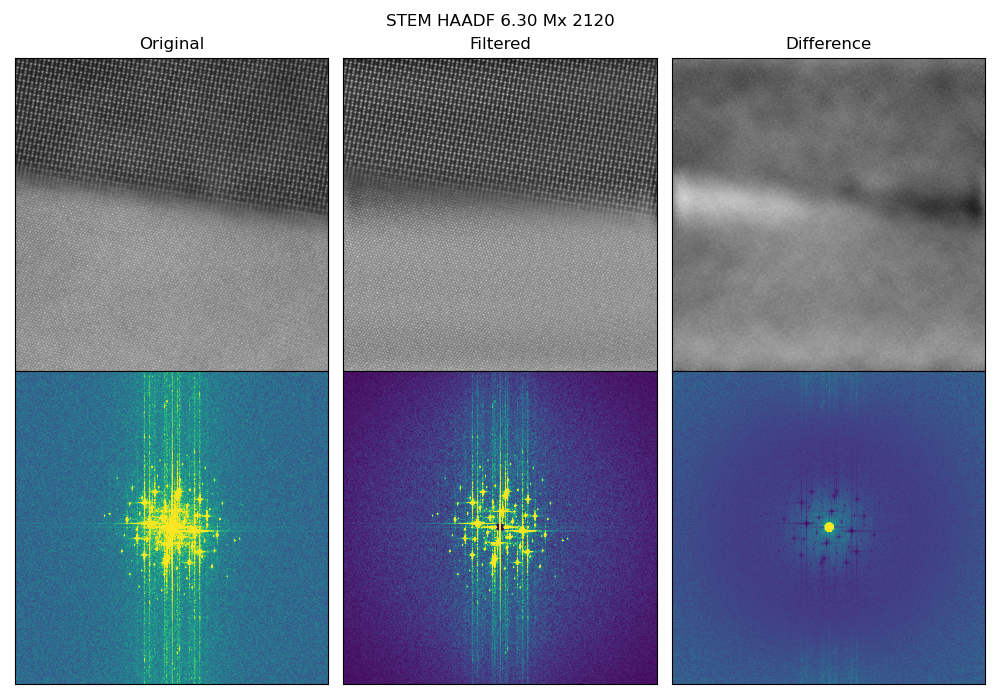

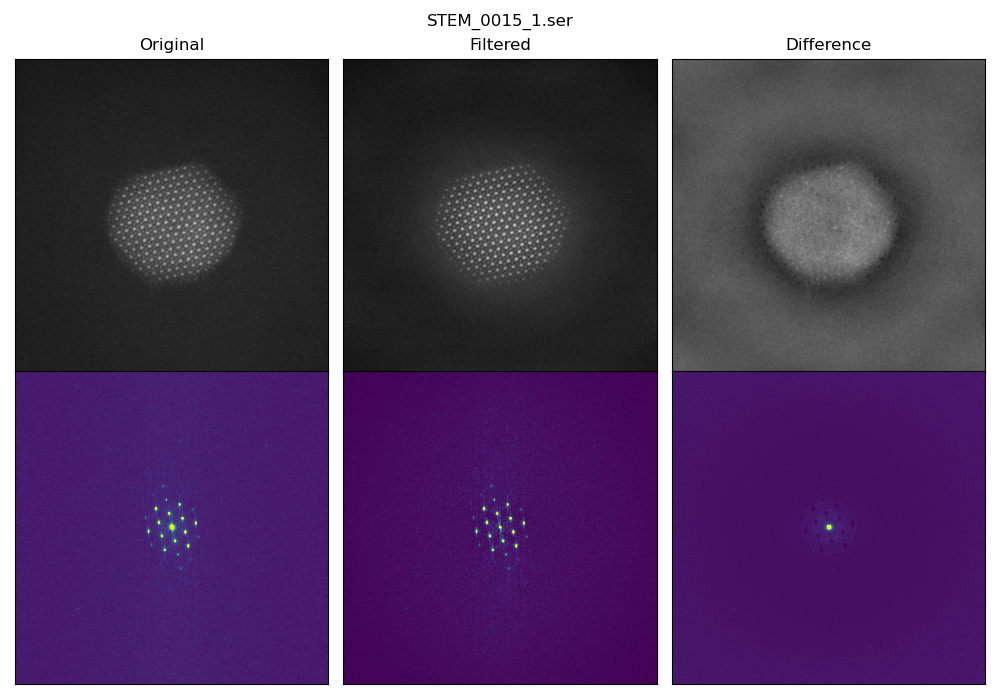

In [6]:
# For Wiener filter, run this cell
# Iterate through all images, apply filters, and save

for i in imgs:
    img = load(i)
    img_path = getDirectory(i, s='/')
    img_name = getFileName(i)
    img_data = img.data
    # If the input image is not square, crop to square size
    if img_data.shape[0] != img_data.shape[1]:
        img_data = filters.crop_to_square(img_data)

    # Apply filter and plot
    img_wf, diff_wf = filters.wiener_filter(img_data, delta=delta, lowpass_order=lp_order, lowpass_cutoff=lp_cutoff)
    plot_imgs(img_data, img_wf, diff_wf, title = img_name, FFT=True, fft_vmax=1e6)

    # Save filtered as tif
    img.data = img_wf
    img.save(img_path + img_name + '_Wiener filtered.tif', overwrite=True)

## 3.2 Average background subtraction filter
This cell applies the abs filter on all the images and save as tif.

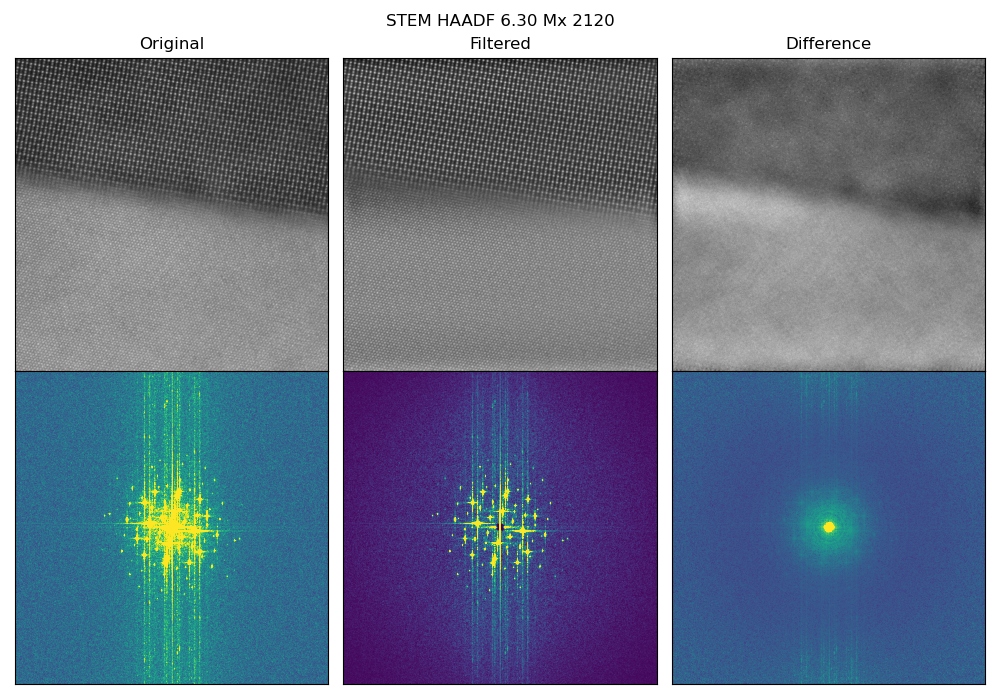

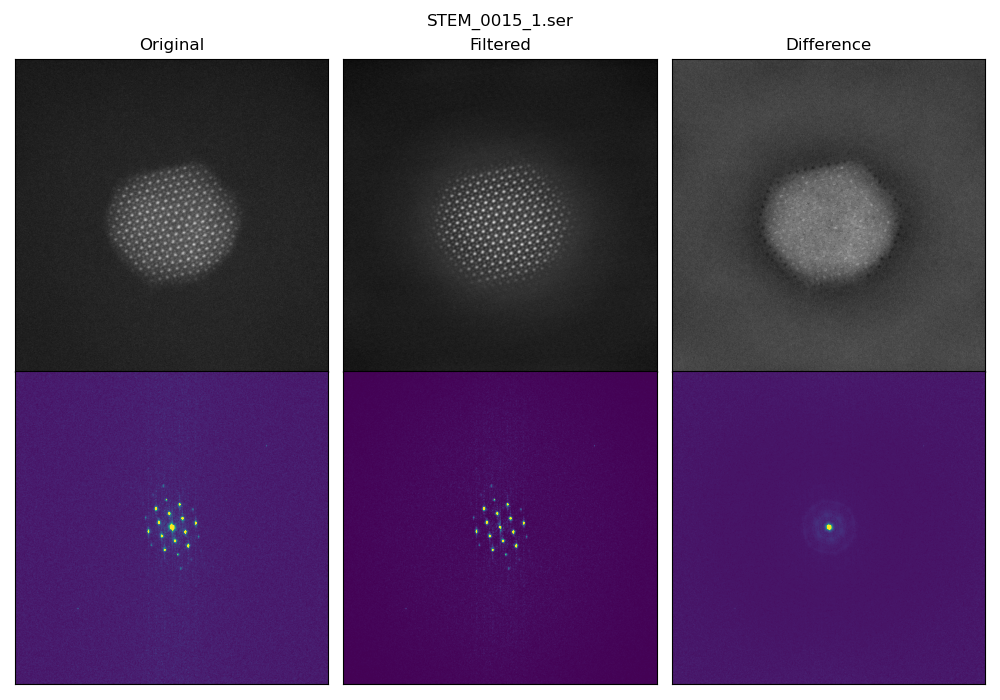

In [7]:
# For ABSF filter, run this cell
# Iterate through all images, apply filters, and save
for i in imgs:
    img = load(i)
    img_path = getDirectory(i, s='/')
    img_name = getFileName(i)
    img_data = img.data
    # If the input image is not square, crop to square size
    if img_data.shape[0] != img_data.shape[1]:
        img_data = filters.crop_to_square(img_data)

    # Apply filter and plot
    img_absf, diff_absf = filters.abs_filter(img_data, delta=delta, lowpass_order=lp_order, lowpass_cutoff=lp_cutoff)
    plot_imgs(img_data, img_absf, diff_absf, title = img_name, FFT=True, fft_vmax=1e6)

    # Save filtered as tif
    img.data = img_absf
    img.save(img_path + img_name + '_ABSF filtered.tif', overwrite=True)

## 3.3 Nonlinear filter
This cell applies the nonlinear filter on all the images and save as tif. The number of iterations `N` needs to be set before running. Note that this cell takes time. Be patient!

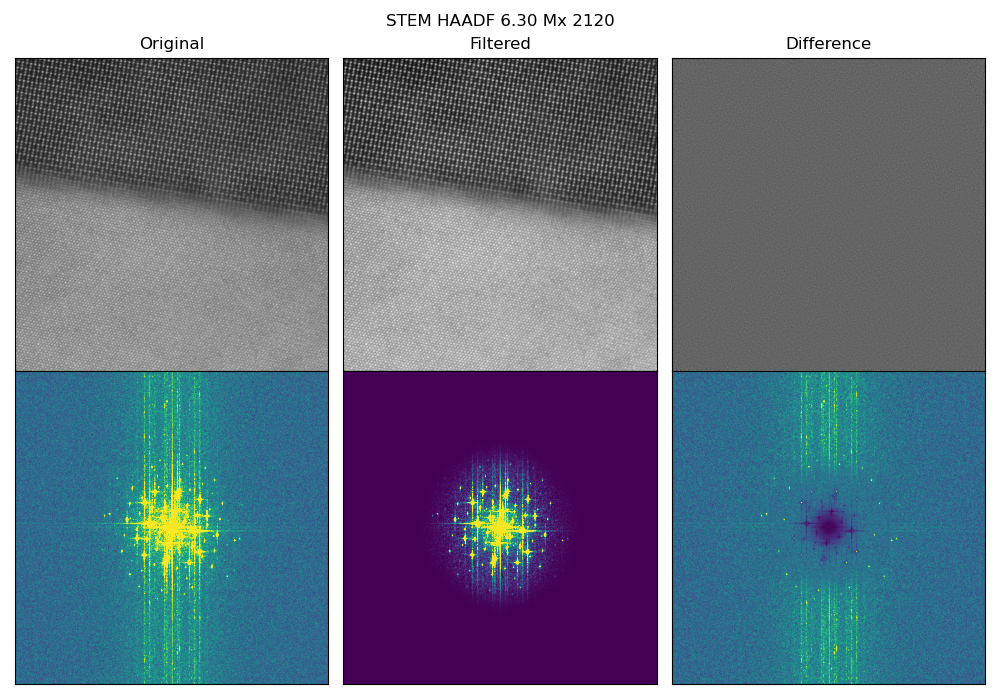

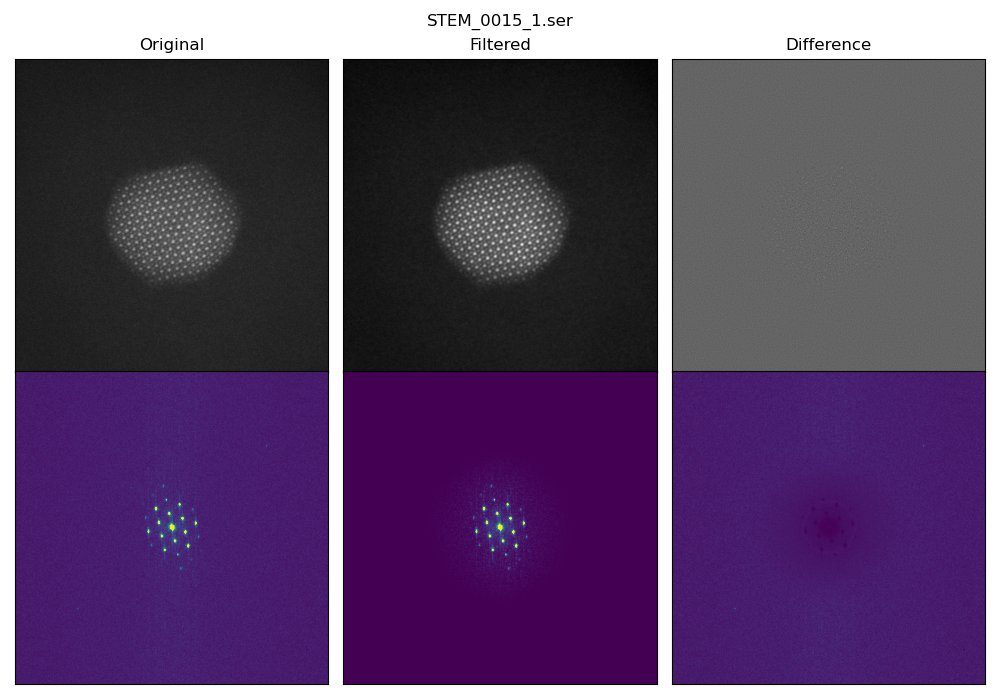

In [8]:
# For nonlinear filter, run this cell
# Iterate through all images, apply filters, and save
N = 50 # Number of iterations for nonliear filter ONLY
for i in imgs:
    img = load(i)
    img_path = getDirectory(i, s='/')
    img_name = getFileName(i)
    img_data = img.data
    # If the input image is not square, crop to square size
    if img_data.shape[0] != img_data.shape[1]:
        img_data = filters.crop_to_square(img_data)

    # Apply filter and plot
    img_nl, diff_nl = filters.nlfilter(img_data, N = N, delta=delta, lowpass=True, lowpass_cutoff=0.3)
                                         
    plot_imgs(img_data, img_nl, diff_nl, title=img_name, FFT=True, fft_vmax=1e6)

    # Save filtered as tif
    img.data = img_nl
    img.save(img_path + img_name + '_nonlinear filtered.tif', overwrite=True)

## 3.4 Lowpass filtering only
There also provided are two lowpass filter functions: Gaussian lowpass and Butterworth lowpass. It is possible to apply only a lowpass filter on the input and save.

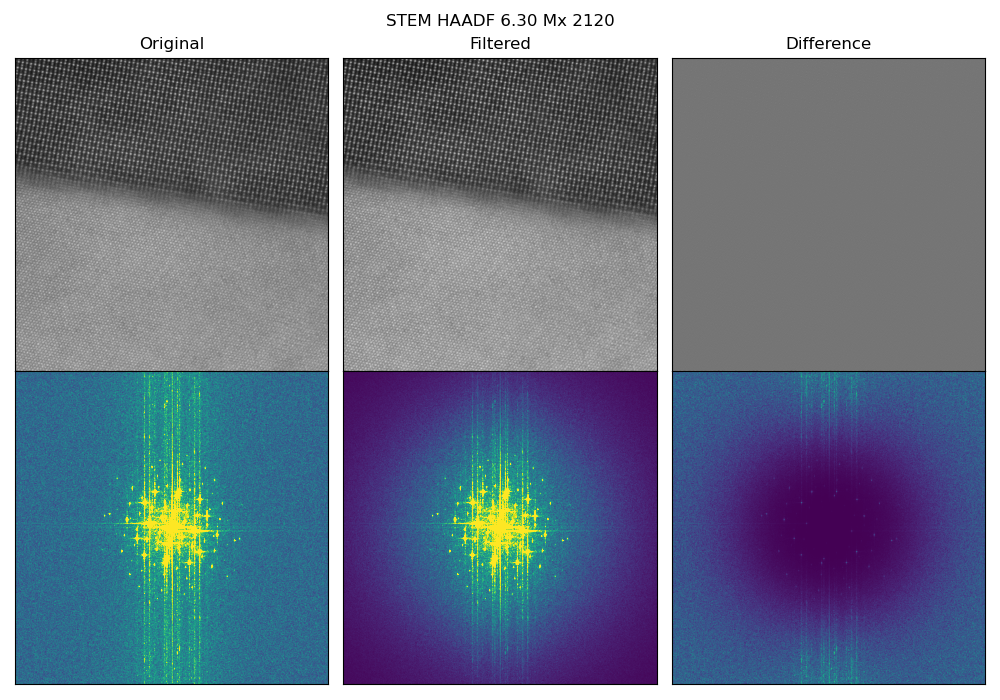

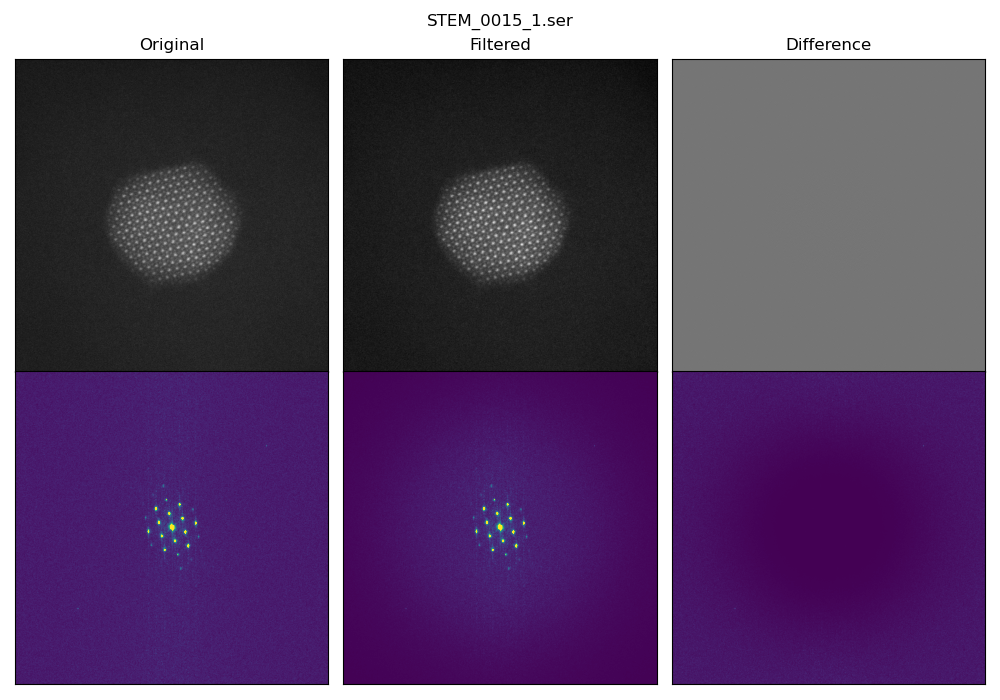

In [11]:
# Apply a Butterworth lowpass filter
lp_order = 2
lp_cutoff = 0.3
for i in imgs:
    img = load(i)
    img_path = getDirectory(i, s='/')
    img_name = getFileName(i)
    img_data = img.data
    # If the input image is not square, crop to square size
    if img_data.shape[0] != img_data.shape[1]:
        img_data = filters.crop_to_square(img_data)

    # Apply filter and plot
    img_bw = filters.bw_lowpass(img_data, lp_order, lp_cutoff)
    img_bw = np.single(img_bw) #Convert to 32-bit float
    diff_bw = img_data - img_bw
                                         
    plot_imgs(img_data, img_bw, diff_bw, title=img_name, FFT=True, fft_vmax=1e6)

    # Save filtered as tif
    img.data = img_bw
    img.save(img_path + img_name + '_BW filtered.tif', overwrite=True)


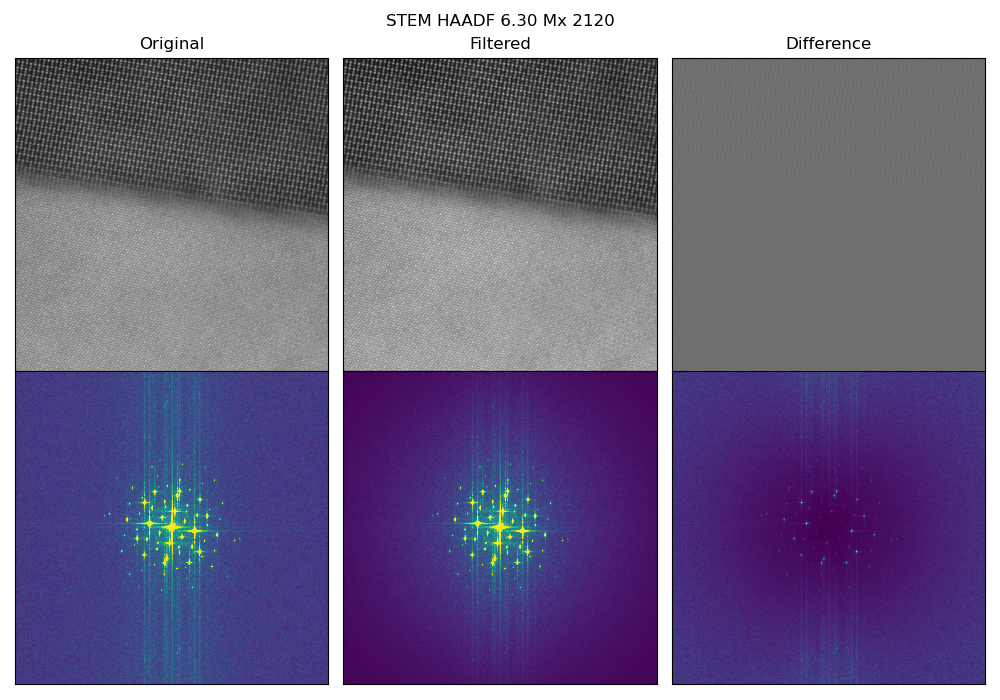

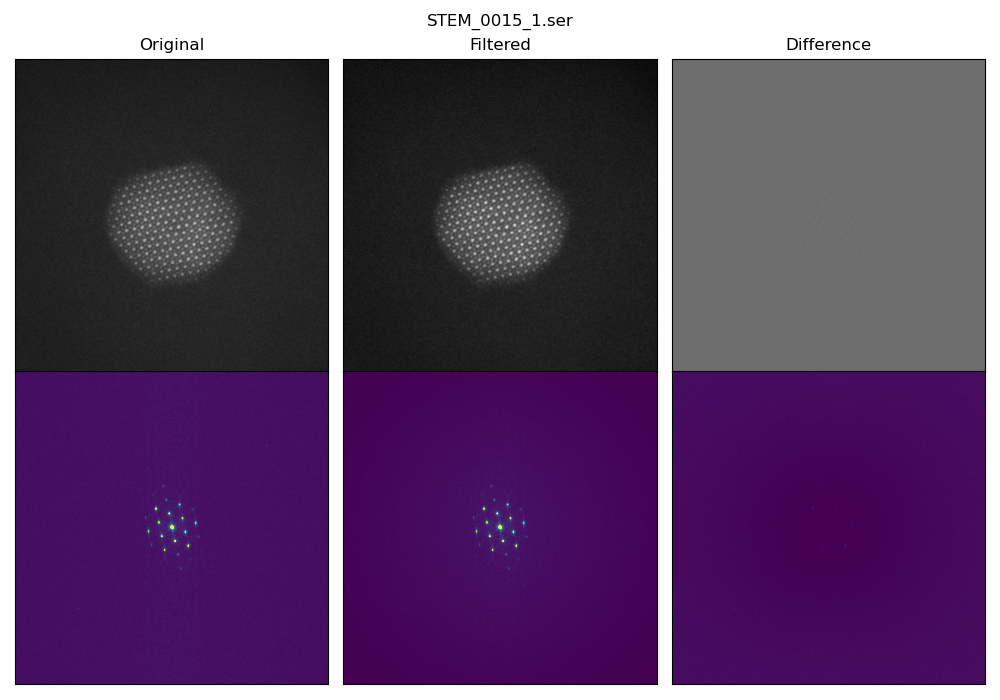

In [12]:
# Apply a Gaussian lowpass filter
for i in imgs:
    img = load(i)
    img_path = getDirectory(i, s='/')
    img_name = getFileName(i)
    img_data = img.data
    # If the input image is not square, crop to square size
    if img_data.shape[0] != img_data.shape[1]:
        img_data = filters.crop_to_square(img_data)

    # Apply filter and plot
    img_glp = filters.gaussian_lowpass(img_data, lp_cutoff)
    img_glp = np.single(img_glp) # Convert to 32-bit float
    diff_glp = img_data - img_glp
                                         
    plot_imgs(img_data, img_glp, diff_glp, title=img_name, FFT=True, fft_vmax=2e6)

    # Save filtered as tif
    img.data = img_bw
    img.save(img_path + img_name + '_Gaussian filtered.tif', overwrite=True)